## Reset Previous Work

In [1]:
pth = "/bigstore/GeneralStorage/fangming/projects/test_merfish/data"

In [2]:
from MERFISH_Objects.execute_class import *
import shutil

2022-08-22 13:50:34,882 [INFO] WRITING LOG OUTPUT TO /home/fangming/.cellpose/run.log


In [3]:
import importlib
# importlib.reload(MERFISH_Objects.execute_class)

In [4]:
cword_config = 'merfish_config_zebrafinch'
config = importlib.import_module(cword_config)

In [5]:
metadata_path = '/bigstore/Images2022/Gaby/Zebrafinch/Zebra_B0_2022Jul11/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'merfish_config_zebrafinch'
config = importlib.import_module(cword_config)
parameters = config.parameters
fishdata_path = os.path.join(metadata_path, parameters['fishdata'])
utilities_path = parameters['utilities_path']

In [6]:
for key in parameters:
    if key.endswith('path') or key.endswith('data'):
        print(key, parameters[key])

daemon_path /scratch/test_daemon_FX
utilities_path /scratch/test_merfish_FX
fishdata fishdata_testFX


In [7]:
import time
from tqdm import trange
import pandas as pd
from collections import Counter
import numpy as np
from Bio import SeqIO

In [8]:
from MERFISH_Objects.execute_class import *
metadata_path = '/bigstore/Images2022/Gaby/Zebrafinch/Zebra_B0_2022Jul11/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'merfish_config_zebrafinch'
config = importlib.import_module(cword_config)
bitmap = config.bitmap
parameters = config.parameters

[('RS0095', 'hybe1', 'FarRed'),
 ('RS0109', 'hybe2', 'FarRed'),
 ('RS0175', 'hybe3', 'FarRed'),
 ('RS0237', 'hybe4', 'FarRed'),
 ('RS0307', 'hybe5', 'FarRed'),
 ('RS0332', 'hybe6', 'FarRed'),
 ('RS0384', 'hybe10', 'FarRed'),
 ('RS0406', 'hybe11', 'FarRed'),
 ('RS0451', 'hybe12', 'FarRed'),
 ('RS0468', 'hybe13', 'FarRed'),
 ('RS0548', 'hybe14', 'FarRed'),
 ('RS64.0', 'hybe15', 'FarRed'),
 ('RS156.0', 'hybe19', 'FarRed'),
 ('RS278.0', 'hybe20', 'FarRed'),
 ('RS313.0', 'hybe21', 'FarRed'),
 ('RS643.0', 'hybe22', 'FarRed'),
 ('RS740.0', 'hybe23', 'FarRed'),
 ('RS810.0', 'hybe24', 'FarRed')]

In [9]:
posname = '7-Pos004_003'#image_metadata.posnames[0]

# Process Single Position

In [10]:
%%time
self = Dataset_Class(metadata_path, dataset, cword_config, verbose=True)
self.main()

13:50:35 Checking Imaging: 0it [00:00, ?it/s]
13:50:35 Checking Hot Pixel: 0it [00:00, ?it/s]
13:50:35 Checking Position Flags: 100%|██████████| 150/150 [00:00<00:00, 1406.20it/s]

CPU times: user 130 ms, sys: 21 ms, total: 152 ms
Wall time: 207 ms


### Image

In [11]:
def pfunc(data):
    hybe = data['hybe']
    channel = data['channel']
    zindex = data['zindex']
    self = Image_Class(metadata_path,dataset,posname,hybe,channel,zindex,cword_config,verbose=False)
    self.main()

In [19]:
%%time
Input = []
hybe = 'hybe2'
channel = 'FarRed'
self = Stack_Class(metadata_path,dataset,posname,hybe,channel,cword_config,verbose=False)
self.check_projection()
zindexes = self.zindexes
for readout_probe,hybe,channel in bitmap:
    for zindex in zindexes:
        data = {'hybe':hybe,'channel':channel,'zindex':zindex}
        Input.append(data)

# ncpu = 30
# pool = multiprocessing.Pool(ncpu)
# sys.stdout.flush()
# results = pool.imap(pfunc, Input)
# iterable = tqdm(results,total=len(Input),desc=str(datetime.now().strftime("%H:%M:%S"))+' '+dataset,position=0)
# for i in iterable:
#     pass
# pool.close()
# sys.stdout.flush()

CPU times: user 50.7 ms, sys: 7.9 ms, total: 58.6 ms
Wall time: 58.8 ms


##### Visual Check

In [20]:
x_window = [500,750]
y_window = [1000,1250]

In [21]:
hybe1 = [i for i in os.listdir(metadata_path) if 'hybe1_' in i][-1]
image_metadata = Metadata(os.path.join(metadata_path,hybe1))

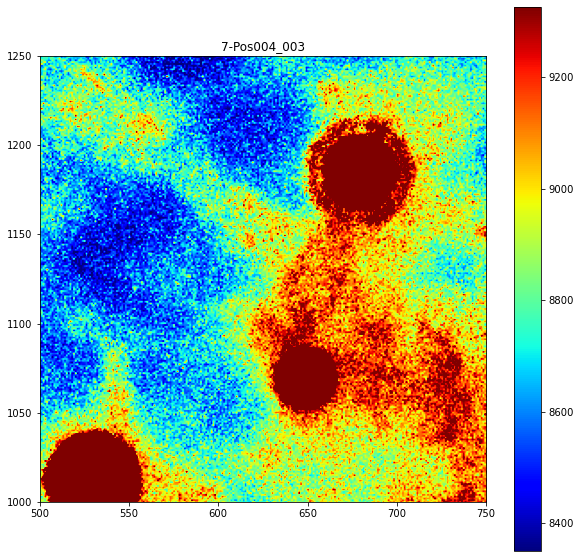

In [22]:
""" Decide on Zoom """
img = image_metadata.stkread(Position=posname, Channel='DeepBlue').max(2)
vmin,vmax = np.percentile(img.ravel(),[25,95])
plt.figure(figsize=[10,10])
plt.title(posname)
plt.imshow(img,vmin=vmin,vmax=vmax,cmap='jet')
plt.colorbar()
plt.xlim(x_window)
plt.ylim(y_window)
plt.show()

In [31]:
def plot_raw_proc(raw_img, prc_img):
    """
    """
    fig, axs = plt.subplots(1, 2, figsize=(10*2,10), sharex=True, sharey=True)
    ax = axs[0]
    vmin,vmax = np.percentile(raw_img.ravel(),[50,99.9])
    ax.set_aspect('equal')
    ax.set_title('Raw')
    g = ax.imshow(raw_img, vmin=vmin, vmax=vmax, cmap='jet')
    fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    ax.set_xlim(x_window)
    ax.set_ylim(y_window)

    ax = axs[1]
    vmin,vmax = np.percentile(prc_img.ravel(), [50,99.9])
    ax.set_aspect('equal')
    ax.set_title('Proc')
    g = ax.imshow(prc_img, vmin=vmin, vmax=vmax, cmap='jet')
    fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    ax.set_xlim(x_window)
    ax.set_ylim(y_window)
    fig.subplots_adjust(wspace=-0.3)
    plt.show()
    
    return

def plot_onepanel(ax, img, x_window=None, y_window=None, title='', cbar=False):
    """
    """
    vmin,vmax = np.percentile(img.ravel(),[50,99.9])
    ax.set_aspect('equal')
    ax.set_title(title)
    g = ax.imshow(img, vmin=vmin, vmax=vmax, cmap='jet')
    if cbar:
        fig.colorbar(g, ax=ax, shrink=0.5, location='bottom', pad=0.05)
    if x_window is not None:
        ax.set_xlim(x_window)
    if y_window is not None:
        ax.set_ylim(y_window)

    return

In [27]:
""" Project Last """
zindex = zindexes[0]
raw_imgs = {}
prc_imgs = {}
prc2_imgs = {}

for i, (readout, hybe, channel) in enumerate(bitmap):
    print(readout,hybe,channel)
    """ Raw Image Zoom"""
    self = Image_Class(metadata_path, dataset, posname, hybe, channel, zindex ,cword_config, verbose=False)
    self.load_data()
    self.project()
    raw_img = self.img
    prc_img = self.fishdata.load_data('image', 
                                      dataset=self.dataset,
                                      posname=self.posname,
                                      hybe=self.hybe,
                                      channel=self.channel,
                                      zindex=self.zindex,
                                     )
    prc2_img = prc_img/self.parameters['gain']
    
    raw_imgs[i] = raw_img
    prc_imgs[i] = prc_img
    prc2_imgs[i] = prc2_img

RS0095 hybe1 FarRed
RS0109 hybe2 FarRed
RS0175 hybe3 FarRed
RS0237 hybe4 FarRed
RS0307 hybe5 FarRed
RS0332 hybe6 FarRed
RS0384 hybe10 FarRed
RS0406 hybe11 FarRed
RS0451 hybe12 FarRed
RS0468 hybe13 FarRed
RS0548 hybe14 FarRed
RS64.0 hybe15 FarRed
RS156.0 hybe19 FarRed
RS278.0 hybe20 FarRed
RS313.0 hybe21 FarRed
RS643.0 hybe22 FarRed
RS740.0 hybe23 FarRed
RS810.0 hybe24 FarRed


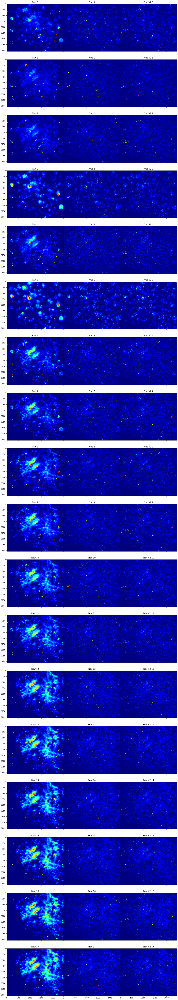

In [28]:
fig, axs = plt.subplots(18, 3, figsize=(6*3,6*18), sharex=True, sharey=True)
for i in range(18):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, None, None, title=f'Raw {i}')
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, None, None, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, None, None, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)

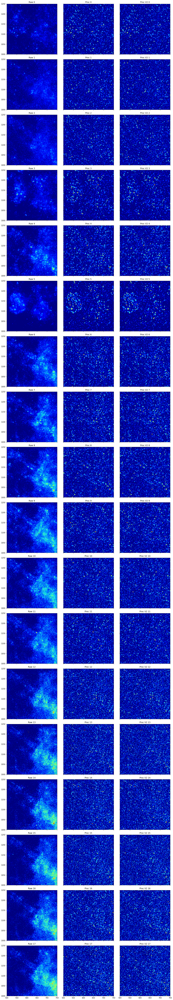

In [29]:
fig, axs = plt.subplots(18, 3, figsize=(6*3,6*18), sharex=True, sharey=True)
for i in range(18):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, x_window, y_window, title=f'Raw {i}')
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, x_window, y_window, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, x_window, y_window, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)

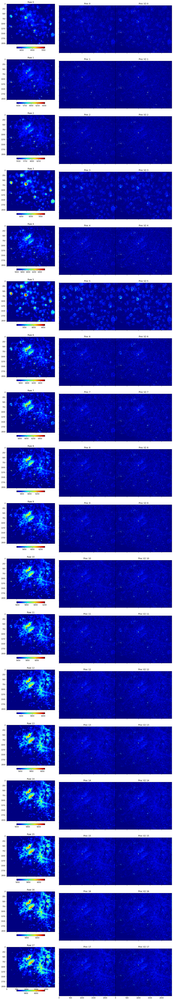

In [32]:
fig, axs = plt.subplots(18, 3, figsize=(6*3,6*18), sharex=True, sharey=True)
for i in range(18):
    ax = axs[i,0]
    raw_img = raw_imgs[i]
    plot_onepanel(ax, raw_img, None, None, title=f'Raw {i}', cbar=True)
    
    ax = axs[i, 1]
    prc_img = prc_imgs[i]
    plot_onepanel(ax, prc_img, None, None, title=f'Proc {i}')
    
    ax = axs[i, 2]
    prc2_img = prc2_imgs[i]
    plot_onepanel(ax, prc2_img, None, None, title=f'Proc V2 {i}')
    
fig.subplots_adjust(wspace=0, hspace=0.1)